<a href="https://colab.research.google.com/github/santanusingha19/Image_Processing_with_Python/blob/main/Project_Test_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

In [ ]:
from skimage import io
from google.colab.patches import cv2_imshow

In [ ]:
import pandas as pd
from PIL import Image 

**Image Read**

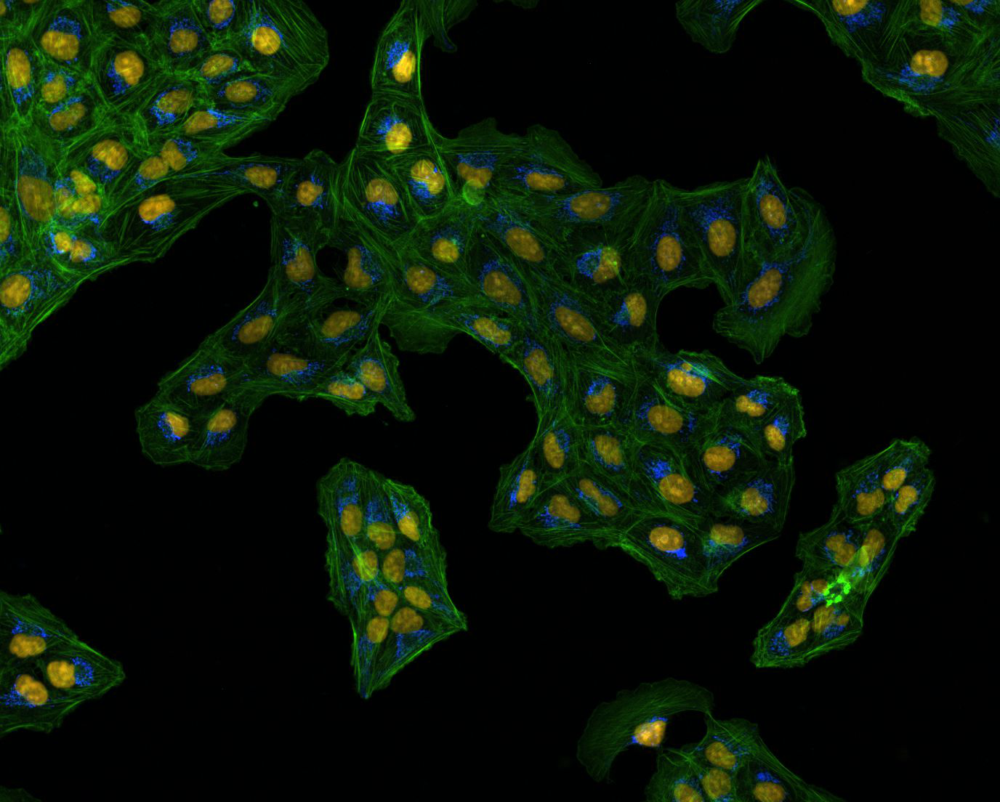

In [ ]:
url = "/content/sample_data/Osteosarcoma_01.jpg"
image = io.imread(url)
cv2_imshow(image)

**BGR to RGB**

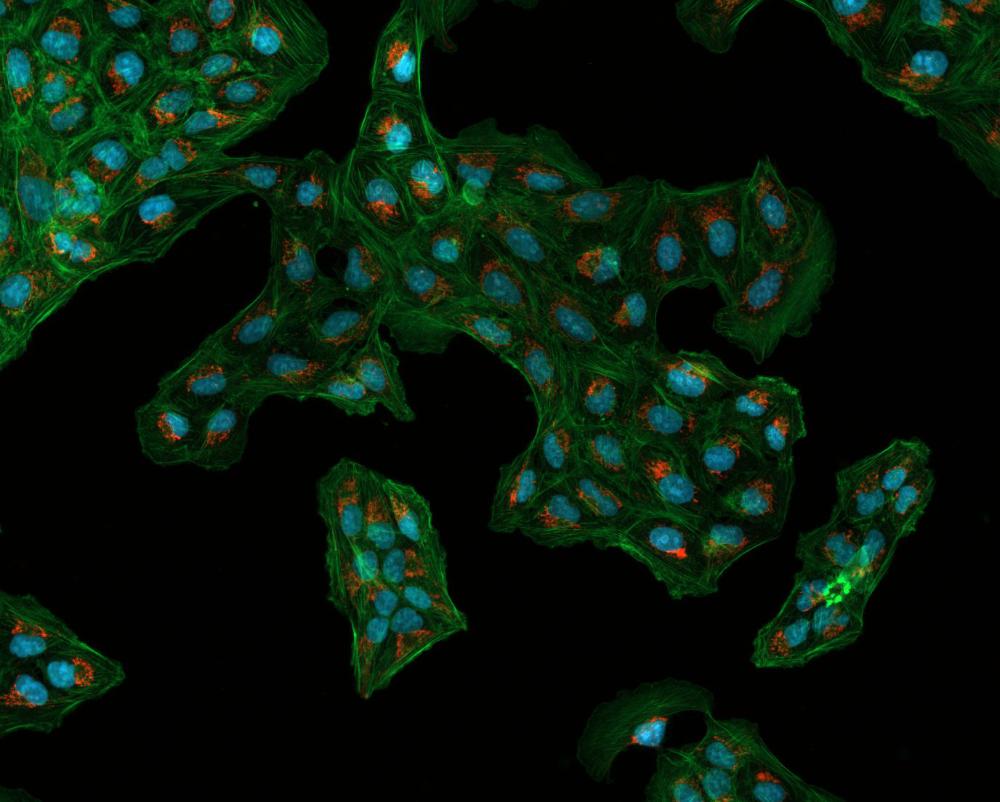

In [ ]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

cv2_imshow(image_2)

**Frame**

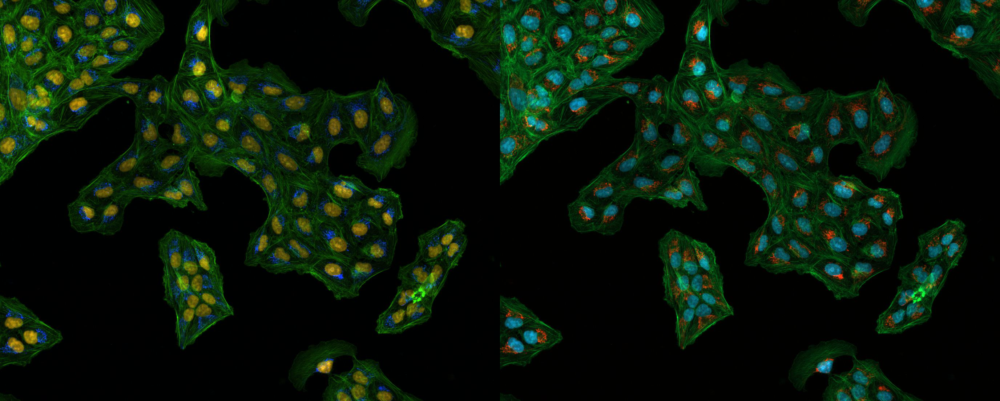

In [ ]:
final_frame = cv.hconcat((image, image_2))
cv2_imshow(final_frame)

In [ ]:

print("Image Matrix Data Type: ", image_2.dtype)
print("Image Height: ", image_2.shape[0])
print("Image width: ", image_2.shape[1])
print("number of channels: ", image_2.shape[2])


Image Matrix Data Type:  uint8
Image Height:  1104
Image width:  1376
number of channels:  3


**Histogram**

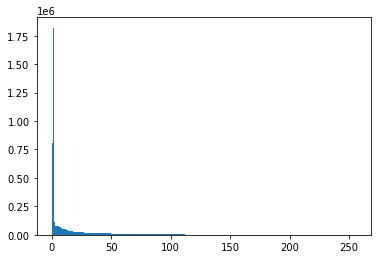

In [ ]:
plt.hist(image_2.ravel(),bins = 256, range = [0,256])
plt.show()

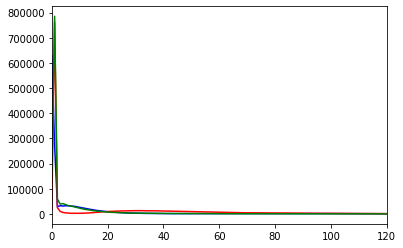

In [ ]:
color = ('b','r','g')
for i, col in enumerate (color):
    histr = cv.calcHist([image_2],[i],None, [256], [0,256])
    plt.plot(histr, color = col)
    plt.xlim([0,120])
plt.show()

**GrayScale**

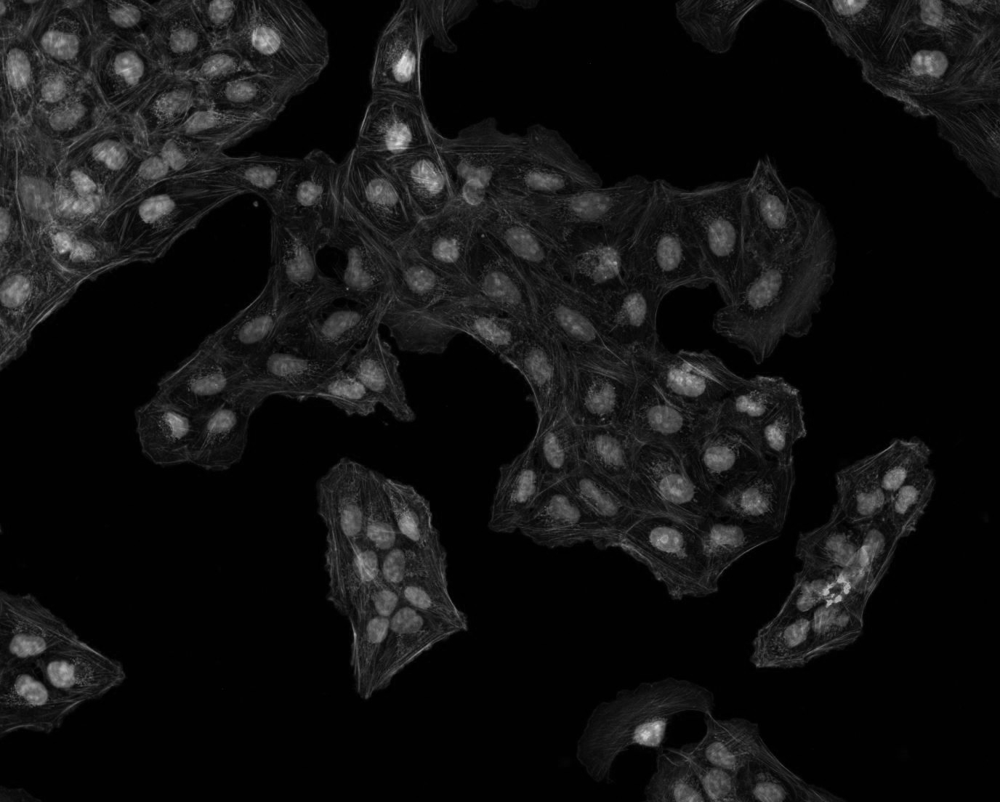

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

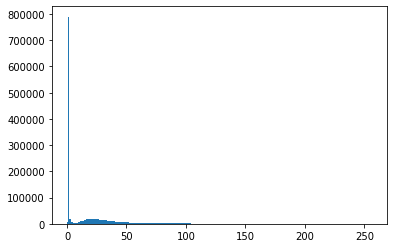

In [ ]:
plt.hist(gray_image.ravel(),bins = 256, range = [0,256])
plt.show()

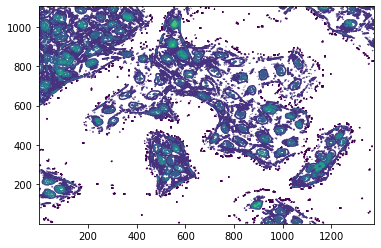

In [ ]:
plt.contour(gray_image, origin = "image")

**Grayscale Transformation**

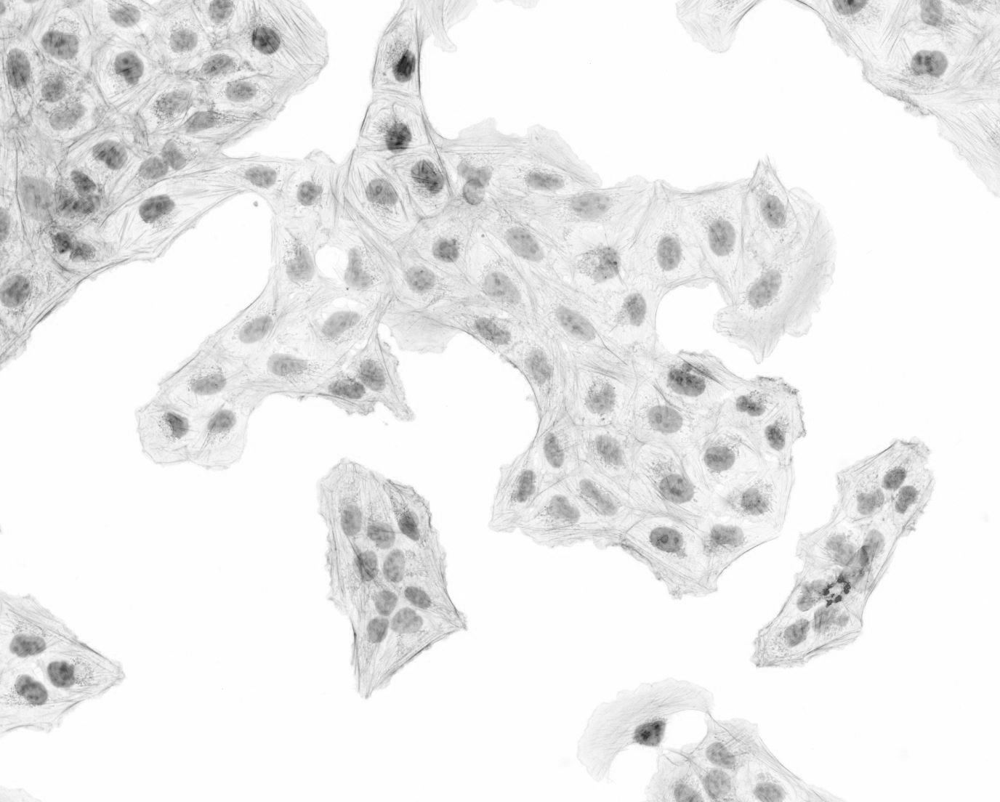

In [ ]:
im2 = 255 - gray_image
cv2_imshow(im2)

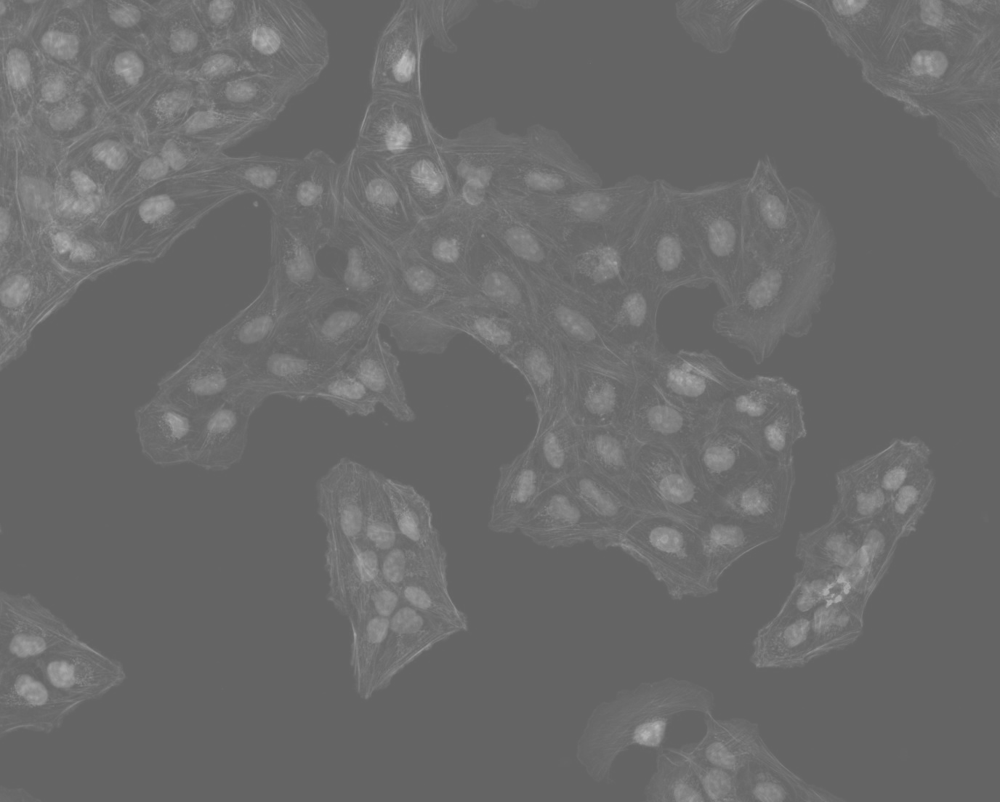

In [ ]:
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

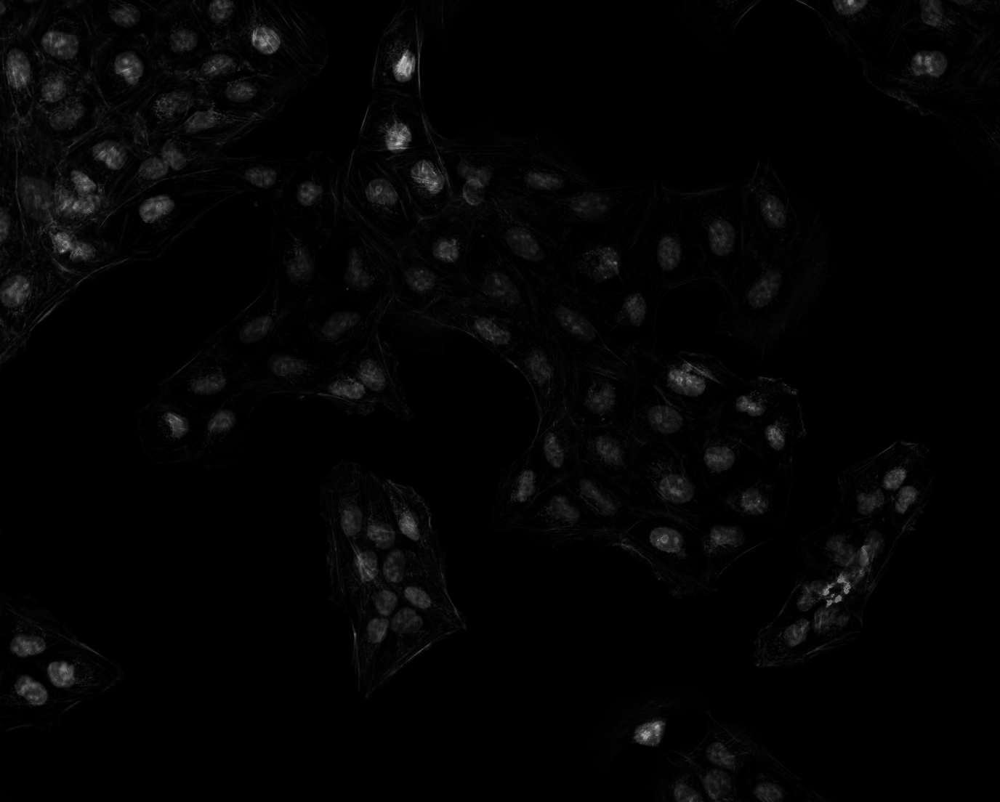

In [ ]:
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

**Fourier Transform of Gray Images**

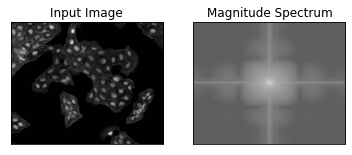

In [ ]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

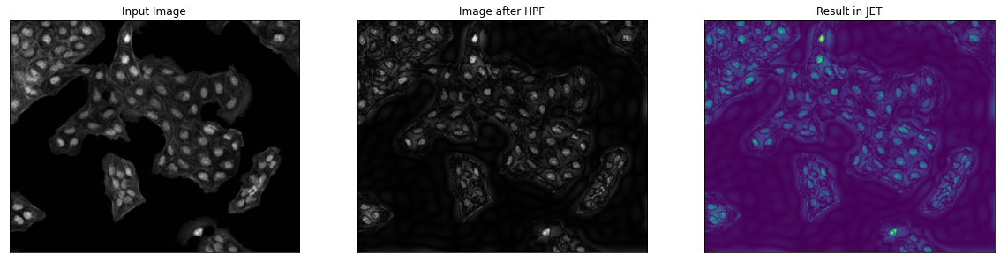

In [ ]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

**Binary Scale Images**

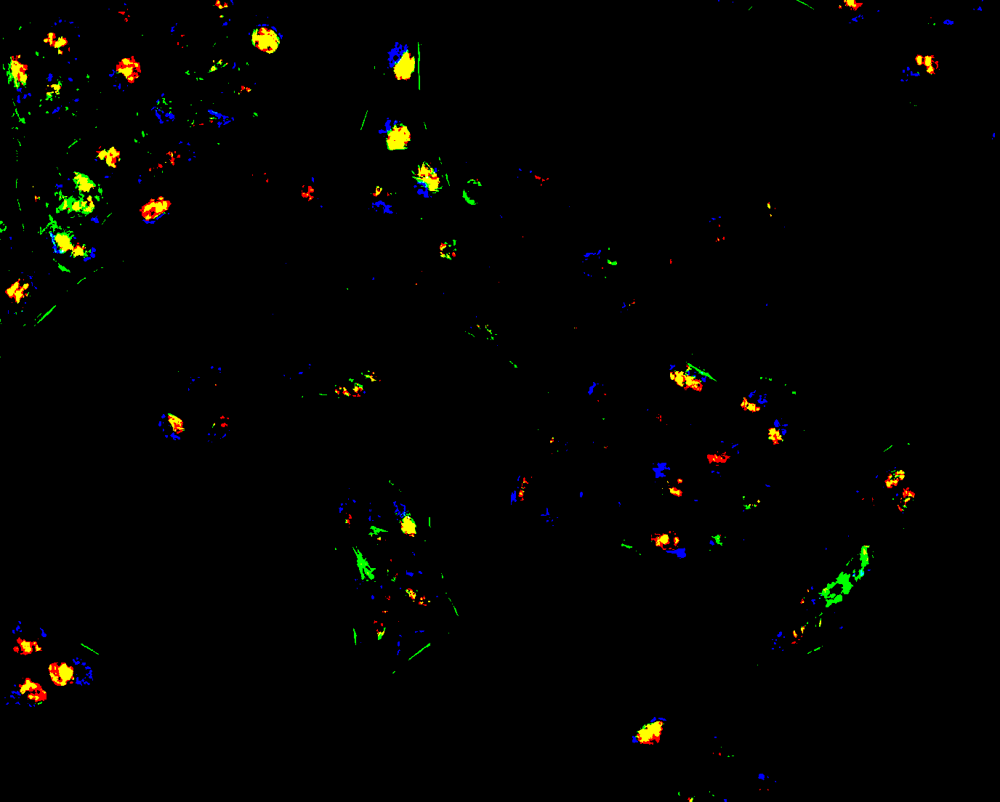

In [ ]:
ret, binary_image = cv.threshold(image,127,255,cv.THRESH_BINARY)
cv2_imshow(binary_image)

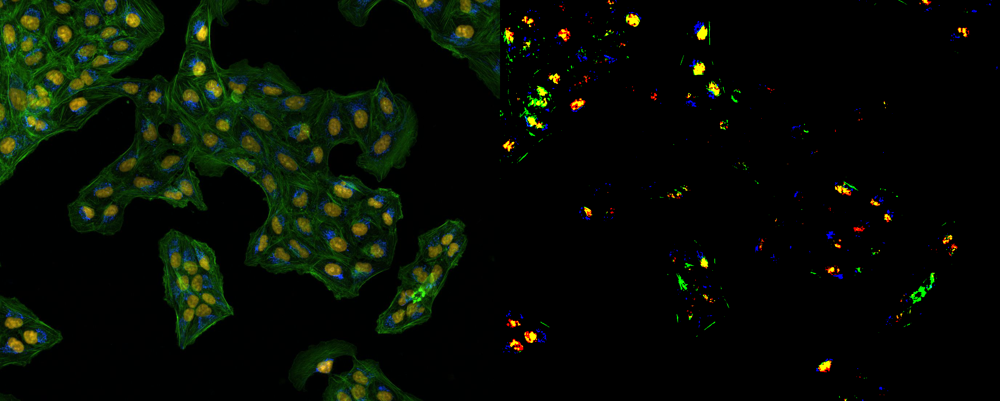

In [ ]:
binary_image_frame = cv.hconcat((image, binary_image))
cv2_imshow(binary_image_frame)